In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import cv2
import os
import numpy as np

### Import combined masks and individual masks

In [2]:
individual_masks_df = pd.read_pickle("2_merged_prolific_data_filtered_normalized.pickle")
len(individual_masks_df)

348

In [3]:
individual_masks_df.head(1)

,instance_id,mask,points_clicked,filename,answer,time_to_submit,prolific_session_id,nr_clicks,caption,foil,linguistic_phenomena,Approval,clip_pred_diff,img_path,mask_normalized
0,20240209102845833682,"[[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0,...","[(177.5, 226), (65.5, 275), (67.5, 283), (367....",000000057027.jpg,caption,76.445115,65c5fe51fd295062720c7d34,6,A baby elephant walks with an older elephant,A baby elephant walks past an older elephant,relations,Approve,0.524429,../VALSE_data/images/coco2017/000000057027.jpg,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."


In [4]:
combined_masks_df = pd.read_pickle("3_combined_masks.pickle")
len(combined_masks_df)

92

### Count how many of each phenomenon are here

In [5]:
combined_masks_df['linguistic_phenomena'].value_counts()

linguistic_phenomena
actions      32
existence    32
relations    28
Name: count, dtype: int64

### Visualize all combined masks

In [6]:
combined_masks_df.head(1)

,filename,img_path,mask_normalized,caption,foil,nr_clicks,linguistic_phenomena,points_clicked,total_clicks,mask_normalized_downsampled
0,000000001584.jpg,../VALSE_data/images/coco2017/000000001584.jpg,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","The red, double decker bus is driving past oth...","The red, double decker bus is driving towards ...","[4, 2, 2]",relations,"[(100, 204), (344, 270), (52, 228), (392, 227)...",8,"[[0.0, 0.0, 0.0, 0.0], [0.041735509019357464, ..."


In [7]:
# inspect shape of each mask

combined_masks_df['mask_normalized'][4].shape

(400, 400)

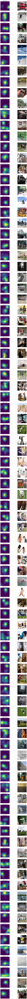

In [8]:
def show_masks(df):
    fig, axs = plt.subplots(nrows=len(df), ncols=2, figsize=(10, 2.5*len(df)))

    for idx, (mask, img_path, nr_clicks) in enumerate(zip(df['mask_normalized'], df['img_path'], df['total_clicks'])):
        
        # Visualize the downsampled mask
        axs[idx][0].imshow(mask, cmap='viridis', vmin=0, vmax=np.max(mask)) 
        axs[idx][0].set_title(f"Total clicks: {nr_clicks}")  
        axs[idx][0].axis('off')
        
        # Load and visualize the image
        img = cv2.imread(os.path.join("../", img_path))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert from BGR to RGB
        img = cv2.resize(img, (300, 300))
        axs[idx][1].imshow(img)
        axs[idx][1].axis('off')

    plt.tight_layout()
    plt.show()

show_masks(combined_masks_df)

# Show all the masks for one file and also the combined mask for that file

Get individual masks and combined mask for that filename

Slected stimulus: counting_103.jpg

Caption: A person counts money. 
Foil: A person pays money.


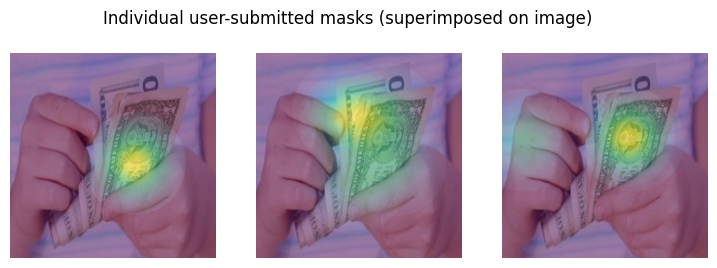

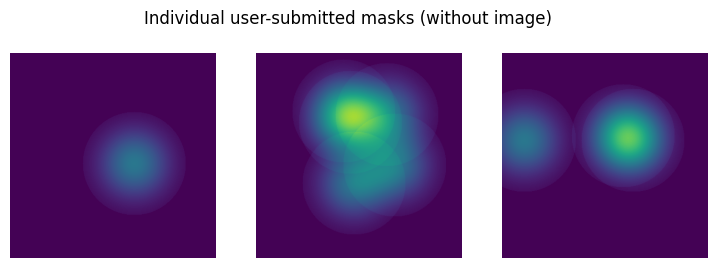

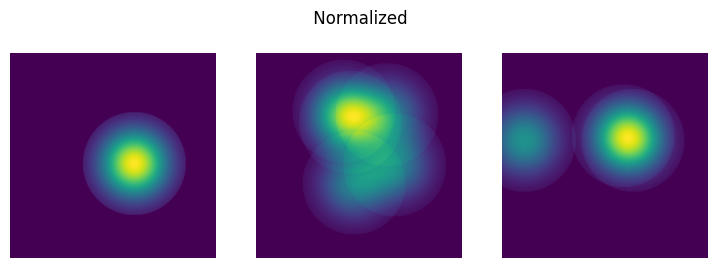

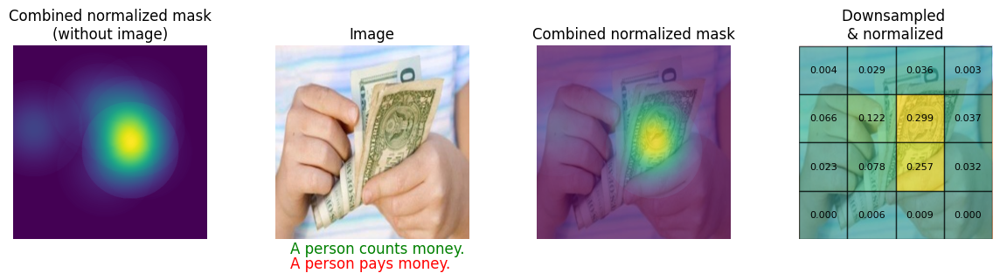

In [9]:

import random
from PIL import Image


filename = random.choice(combined_masks_df['filename'])
# filename = "punching_28.jpg"


print("Slected stimulus:", filename)
caption = combined_masks_df[combined_masks_df['filename']==filename]['caption'].iloc[0]
foil = combined_masks_df[combined_masks_df['filename']==filename]['foil'].iloc[0]
print(f"\nCaption: {caption} \nFoil: {foil}")

# select and load the individual masks -- both original and normalized
selection = individual_masks_df[individual_masks_df['filename'] == filename]
ind_masks = list(selection['mask'])
norm_masks = list(selection['mask_normalized'])

# load the final mask (aggregate)
combi_mask = combined_masks_df[combined_masks_df["filename"]==filename]['mask_normalized'].iloc[0]

downsampled_mask = combined_masks_df[combined_masks_df["filename"]==filename]['mask_normalized_downsampled'].iloc[0]

# get the image path
image_path = os.path.join("../", selection['img_path'].iloc[0])
img = Image.open(image_path)
img = img.resize(combi_mask.shape)

# plot individual masks -- unnormalized
num_masks = min(len(ind_masks), 5)
plt.figure(figsize=(3 * num_masks, 3))
plt.suptitle("Individual user-submitted masks (superimposed on image)")
for i in range(num_masks):
    # Superimposed masks and image
    plt.subplot(1, num_masks, i + 1)
    plt.imshow(img)
    plt.imshow(ind_masks[i], cmap='viridis', alpha=0.5)  # Adjust alpha for mask transparency
    plt.axis('off')
plt.show()

plt.figure(figsize=(3 * num_masks, 3))
plt.suptitle("Individual user-submitted masks (without image)")
for i in range(num_masks):
    # Masks alone
    plt.subplot(1, num_masks, i + 1)
    plt.imshow(ind_masks[i], cmap='viridis', vmin=0, vmax=255)
    plt.axis('off')
plt.show()

# plot normalized masks
num_masks = min(len(norm_masks), 5)
plt.figure(figsize=(3 * num_masks, 3))
plt.suptitle("     Normalized")
for i in range(num_masks):
    plt.subplot(1, num_masks, i+1)
    plt.imshow(norm_masks[i], cmap='viridis', vmin=0, vmax=np.max(norm_masks[i]))
    plt.axis('off')
plt.show()


# GRAPH THE FINAL RESULTS

plt.figure(figsize = (12,3))

# Combined mask
plt.subplot(1, 4, 1)
plt.imshow(combi_mask, cmap='viridis', vmin=0, vmax=np.max(combi_mask))
plt.title("Combined normalized mask\n(without image)")
plt.axis('off')

# Image
ax = plt.subplot(1, 4, 2)
ax.imshow(img.resize((400,400)))
plt.title("Image")
ax.axis('off')

ax.text(30, 430, caption, fontsize=12, color='green')
ax.text(30, 430 + 30, foil, fontsize=12, color='red')

# Superimposed Image and Mask
plt.subplot(1, 4, 3)
plt.imshow(img, )
plt.imshow(combi_mask, cmap='viridis', alpha=0.7)  # Adjust alpha for mask transparency
plt.title("Combined normalized mask")
plt.axis('off')

# Superimposed Image and Mask
ax = plt.subplot(1, 4, 4)
new_img = img.resize((400,400))
patchwidth = 100
ax.imshow(new_img)  # display original image
# set different color maps for negative and positive shap values
norm = plt.Normalize(vmin=-1*downsampled_mask.max(), vmax = downsampled_mask.max())
cmap = plt.cm.viridis

for i in range(4):  # assuming downsampled mask is 4x4
    for j in range(4):

        mask_value = downsampled_mask[i,j]

        color = cmap(norm(mask_value))

        # directly use colormap with normalized SHAP value
        # create and add colored square
        ax.add_patch(plt.Rectangle((j * patchwidth, i * patchwidth), patchwidth, patchwidth, facecolor=color, edgecolor='black', alpha = 0.6))
        # add SHAP value text
        ax.text(j * patchwidth + patchwidth/2, i * patchwidth + patchwidth/2, f'{downsampled_mask[i, j]:.3f}', ha='center', va='center', fontsize=8, color='black')
ax.axis('off')  # hide axis



plt.title("Downsampled \n& normalized")
ax.axis('off')

plt.tight_layout()
plt.show()